In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

df = pd.read_csv('/kaggle/input/d/elmatroryas/diabetescsv/diabetes.csv')


/kaggle/input/diabetes-prediction-dataset/diabetes_prediction_dataset.csv
/kaggle/input/d/elmatroryas/diabetescsv/diabetes.csv


In [21]:
!pip install scikit-learn==1.5.0 imbalanced-learn==0.12.0 --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 62.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 257.7/257.7 kB 13.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cesium 0.12.4 requires numpy<3.0,>=2.0, but you have numpy 1.26.4 which is incompatible.


In [2]:
## Affichage des 5 premier lignes 

In [3]:
df.head()

,diabetes,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,gender,smoking_history
0,0,21.0,0,0,27.32,5.8,126,0,0
1,0,26.0,0,0,27.32,6.6,100,1,0
2,0,49.0,0,0,21.70,5.8,158,0,0
3,0,24.0,0,0,20.47,4.8,100,0,1
4,0,53.0,0,0,31.40,5.7,85,0,0


In [4]:
cleaned_data_v1 = df

In [5]:
colonnes_continues = ["age", "hypertension", "heart_disease", "smoking_history", "bmi", "HbA1c_level", "blood_glucose_level"]

import plotly.express as px
# Transformation des données au format long
data_long = cleaned_data_v1[colonnes_continues].melt(var_name="Variable", value_name="Valeur")

# Création du boxplot avec Plotly
fig = px.box(data_long, x="Variable", y="Valeur", title="Boxplot pour détection des valeurs aberrantes")

fig.update_layout(xaxis_title="", xaxis_tickangle=45, yaxis_title="Valeur", showlegend=False)

fig.show()

In [6]:
fig = px.histogram(data_long, x="Valeur", facet_col="Variable", facet_col_wrap=3, 
                   title="Distribution des variables continues", nbins=10)

fig.update_layout(height=800, showlegend=False)
fig.show()

In [7]:
corr = cleaned_data_v1.corr()

# Création de la heatmap interactive
fig = px.imshow(
    corr,
    text_auto=".2f",  # Affiche les valeurs numériques avec 2 décimales
    labels=dict(color="Correlation"),
    x=corr.columns,
    y=corr.columns,
    aspect="auto",  # Pour éviter l'étirement
    title="Correlation Matrix"
)

fig.update_layout(width=800, height=500)
fig.show()

<Axes: xlabel='age', ylabel='diabetes'>

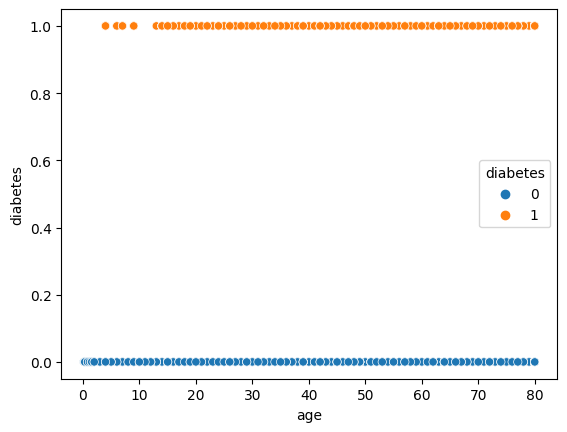

In [15]:
import seaborn as sns
# Avant de passer au modèle on va regarder la répartition des diabétiques dans le dataset
sns.scatterplot(x='age', y='bmi', hue='diabetes', data=cleaned_data_v1)

In [17]:
count_df = cleaned_data_v1['diabetes'].value_counts().reset_index()
count_df.columns = ['diabetes', 'count']
count_df['diabetes'] = count_df['diabetes'].map({0: "Non diabétique", 1: "Diabétique"})

# Bar chart
fig = px.bar(count_df,
             x='diabetes',
             y='count',
             color='diabetes',
             title="Répartition des personnes diabétiques vs non diabétiques",
             text='count')

fig.update_layout(xaxis_title="Classe",
                  yaxis_title="Nombre de personnes",
                  showlegend=False)

fig.show()

# On remarque que la répartition de diabétique et non diabétique est trop différente. Cela risque de fausser les résultats du modèle. On va donc "rajouter" des diabétiques en plus dans le dataset avec SMOT

In [10]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split

df_diabetic = cleaned_data_v1[cleaned_data_v1['diabetes'] == 1]
df_nondiabetic = cleaned_data_v1[cleaned_data_v1['diabetes'] == 0]

In [11]:
# 3. Prendre un échantillon

In [18]:
df_diabetic_sample = df_diabetic.sample(n=7000, random_state=42)
df_nondiabetic_sample = df_nondiabetic.sample(n=9000, random_state=42)

In [19]:
# 4. Concaténer les deux
df_balanced = pd.concat([df_diabetic_sample, df_nondiabetic_sample])


In [20]:
# 5. Mélanger l'ensemble
df_balanced = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)

count_df = df_balanced['diabetes'].value_counts().reset_index()
count_df.columns = ['diabetes', 'count']
count_df['diabetes'] = count_df['diabetes'].map({0: "Non diabétique", 1: "Diabétique"})

# Bar chart
fig = px.bar(count_df,
             x='diabetes',
             y='count',
             color='diabetes',
             title="Répartition des personnes diabétiques vs non diabétiques",
             text='count')

fig.update_layout(xaxis_title="Classe",
                  yaxis_title="Nombre de personnes",
                  showlegend=False)

fig.show()

In [35]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

from sklearn.metrics import classification_report, confusion_matrix

X = df_balanced.drop('diabetes', axis=1)
y = df_balanced['diabetes']

In [36]:
# Séparation X / y
X = df_balanced.drop('diabetes', axis=1)
y = df_balanced['diabetes']


In [37]:
# Séparer en train/test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

In [38]:

# Standardisation
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [40]:
svm_model = SVC(kernel='poly', C=1, gamma='scale', random_state=42)
svm_model.fit(X_train_scaled, y_train)

SVC(C=1, kernel='poly', random_state=42)

In [34]:
y_pred = svm_model.predict(X_test_scaled)

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[1645  155]
 [ 184 1216]]
              precision    recall  f1-score   support

           0       0.90      0.91      0.91      1800
           1       0.89      0.87      0.88      1400

    accuracy                           0.89      3200
   macro avg       0.89      0.89      0.89      3200
weighted avg       0.89      0.89      0.89      3200

